# Assignment ML Cleaning

In this assignment we will be answering the following questions:
* What are the data types? (Only numeric and categorical)
* Are there missing values?
* What are the likely distributions of the numeric variables?
* Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)
* Which independent variables have missing data? How much?
* Do the training and test sets have the same data?
* In the predictor variables independent of all the other predictor variables?
* Which predictor variables are the most important?
* Do the ranges of the predictor variables make sense?
* What are the distributions of the predictor variables?
* Remove outliers and keep outliers (does if have an effect of the final predictive model)?
* Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values? That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.


## Dataset information
Data Set Characteristics - Time Series, Multivariate, Sequential
Attribute Characteristics- Real

Attribute information -
* WSRPK: continuous. Peek wind speed -- resultant (meaning average of wind vector) 
* WSRAV: continuous. Average wind speed
* TPK: continuous. Peak T 
* TAV: continuous. Average T
* T85: continuous. T at 850 hpa level (or about 1500 m height)
* RH85: continuous. Relative Humidity at 850 hpa
* U85: continuous. (U wind - east-west direction wind at 850 hpa)
* V85: continuous. (V wind - N-S direction wind at 850 hpa)
* HT85: continuous. Geopotential height at 850 hpa, it is about the same as height at low altitude 
* T70: continuous. T at 700 hpa level (roughly 3100 m height)
* RH70: continuous.
* U70: continuous.
* V70: continuous.
* HT70: continuous.
* T50: continuous. T at 500 hpa level (roughly at 5500 m height)
* RH50: continuous.
* U50: continuous.
* V50: continuous.
* HT50: continuous.
* KI: continuous. K-Index 
* TT: continuous. T-Totals 
* SLP: continuous. Sea level pressure 
* SLP_: continuous. SLP change from previous day
* Precp: continuous. Precipitation

We have a Class column at last which says if it is a ozone day or normal day. 

# Data Loading and EDA

In [25]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import sklearn

In [26]:
df = pd.read_csv('onehr.data', sep=",", header = None)
df

,0,1,2,3,4,5,6,7,8,9,...,64,65,66,67,68,69,70,71,72,73
0,1/1/1998,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0,0.0
1,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0.0
2,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0.0
3,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0.0
4,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,?,?,?,?,?,?,?,?,0.58,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2531,12/27/2004,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,0.07,7.93,-4.41,5800,-25.6,21.8,10295,65,0,0.0
2532,12/28/2004,1,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,0.04,5.95,-1.14,5845,-19.4,19.1,10310,15,0,0.0
2533,12/29/2004,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,0.06,7.8,-0.64,5845,-9.6,35.2,10275,-35,0,0.0
2534,12/30/2004,1.3,0.9,1.5,1.2,1.6,1.8,1.1,1,1.9,...,0.25,7.72,-0.89,5845,-19.6,34.2,10245,-30,0.05,0.0


As I loaded the data I can see that there is no column name, also the missing values are marked as '?' which needs to be cleaned and handled.

In [27]:
df.columns = ["Date","WSR0","WSR1","WSR2","WSR3","WSR4","WSR5","WSR6","WSR7","WSR8","WSR9","WSR10","WSR11","WSR12","WSR13","WSR14","WSR15","WSR16","WSR17","WSR18","WSR19","WSR20","WSR21","WSR22","WSR23","WSR_PK","WSR_AV","T0","T1","T2","T3","T4","T5","T6","T7","T8","T9","T10","T11","T12","T13","T14","T15","T16","T17","T18","T19","T20","T21","T22","T23","T_PK","T_AV","T85","RH85","U85","V85","HT85","T70","RH70","U70","V70","HT70","T50","RH50","U50","V50","HT50","KI","TT","SLP","SLP_","Precp","Target"]
df

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/1/1998,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0,0.0
1,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0.0
2,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0.0
3,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0.0
4,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,?,?,?,?,?,?,?,?,0.58,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2531,12/27/2004,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,0.07,7.93,-4.41,5800,-25.6,21.8,10295,65,0,0.0
2532,12/28/2004,1,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,0.04,5.95,-1.14,5845,-19.4,19.1,10310,15,0,0.0
2533,12/29/2004,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,0.06,7.8,-0.64,5845,-9.6,35.2,10275,-35,0,0.0
2534,12/30/2004,1.3,0.9,1.5,1.2,1.6,1.8,1.1,1,1.9,...,0.25,7.72,-0.89,5845,-19.6,34.2,10245,-30,0.05,0.0


I used the attribute information given in another folder names as onehr.names with the dataset folder to load column names as follows.

In [28]:
df.shape

(2536, 74)

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2536 entries, 0 to 2535
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2536 non-null   object 
 1   WSR0    2536 non-null   object 
 2   WSR1    2536 non-null   object 
 3   WSR2    2536 non-null   object 
 4   WSR3    2536 non-null   object 
 5   WSR4    2536 non-null   object 
 6   WSR5    2536 non-null   object 
 7   WSR6    2536 non-null   object 
 8   WSR7    2536 non-null   object 
 9   WSR8    2536 non-null   object 
 10  WSR9    2536 non-null   object 
 11  WSR10   2536 non-null   object 
 12  WSR11   2536 non-null   object 
 13  WSR12   2536 non-null   object 
 14  WSR13   2536 non-null   object 
 15  WSR14   2536 non-null   object 
 16  WSR15   2536 non-null   object 
 17  WSR16   2536 non-null   object 
 18  WSR17   2536 non-null   object 
 19  WSR18   2536 non-null   object 
 20  WSR19   2536 non-null   object 
 21  WSR20   2536 non-null   object 
 22  

All the columns are of object type according to the data reader, but actually our dataset has only 3 types of values which are Date, float and int.

### Lets process the dataset and make it cleaner for the further process.

First lets sort out Target variable and check what are the values that it takes.

In [30]:
df.groupby('Target').count()

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
Target,,,,,,,,,,,,,,,,,,,,,
0.0,2463,2463,2463,2463,2463,2463,2463,2463,2463,2463,...,2463,2463,2463,2463,2463,2463,2463,2463,2463,2463
1.0,73,73,73,73,73,73,73,73,73,73,...,73,73,73,73,73,73,73,73,73,73


In [31]:
df.Target = pd.Categorical(df.Target,[0.0,1.0])

In [32]:
df.Target = df.Target.cat.codes

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2536 entries, 0 to 2535
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    2536 non-null   object
 1   WSR0    2536 non-null   object
 2   WSR1    2536 non-null   object
 3   WSR2    2536 non-null   object
 4   WSR3    2536 non-null   object
 5   WSR4    2536 non-null   object
 6   WSR5    2536 non-null   object
 7   WSR6    2536 non-null   object
 8   WSR7    2536 non-null   object
 9   WSR8    2536 non-null   object
 10  WSR9    2536 non-null   object
 11  WSR10   2536 non-null   object
 12  WSR11   2536 non-null   object
 13  WSR12   2536 non-null   object
 14  WSR13   2536 non-null   object
 15  WSR14   2536 non-null   object
 16  WSR15   2536 non-null   object
 17  WSR16   2536 non-null   object
 18  WSR17   2536 non-null   object
 19  WSR18   2536 non-null   object
 20  WSR19   2536 non-null   object
 21  WSR20   2536 non-null   object
 22  WSR21   2536 non-null   

In [34]:
df

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/1/1998,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0,0
1,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0
2,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0
3,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0
4,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,?,?,?,?,?,?,?,?,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2531,12/27/2004,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,0.07,7.93,-4.41,5800,-25.6,21.8,10295,65,0,0
2532,12/28/2004,1,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,0.04,5.95,-1.14,5845,-19.4,19.1,10310,15,0,0
2533,12/29/2004,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,0.06,7.8,-0.64,5845,-9.6,35.2,10275,-35,0,0
2534,12/30/2004,1.3,0.9,1.5,1.2,1.6,1.8,1.1,1,1.9,...,0.25,7.72,-0.89,5845,-19.6,34.2,10245,-30,0.05,0


In [35]:
df.replace('?', np.nan, inplace = True)
df

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
0,1/1/1998,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,...,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0,0
1,1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,...,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0
2,1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,...,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0
3,1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,...,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0
4,1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2531,12/27/2004,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,...,0.07,7.93,-4.41,5800,-25.6,21.8,10295,65,0,0
2532,12/28/2004,1,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,...,0.04,5.95,-1.14,5845,-19.4,19.1,10310,15,0,0
2533,12/29/2004,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,...,0.06,7.8,-0.64,5845,-9.6,35.2,10275,-35,0,0
2534,12/30/2004,1.3,0.9,1.5,1.2,1.6,1.8,1.1,1,1.9,...,0.25,7.72,-0.89,5845,-19.6,34.2,10245,-30,0.05,0


In [36]:
df.iloc[0:,1:73] = df.iloc[0:,1:73].astype(float) 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2536 entries, 0 to 2535
Data columns (total 74 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2536 non-null   object 
 1   WSR0    2237 non-null   float64
 2   WSR1    2244 non-null   float64
 3   WSR2    2242 non-null   float64
 4   WSR3    2244 non-null   float64
 5   WSR4    2243 non-null   float64
 6   WSR5    2244 non-null   float64
 7   WSR6    2245 non-null   float64
 8   WSR7    2247 non-null   float64
 9   WSR8    2246 non-null   float64
 10  WSR9    2249 non-null   float64
 11  WSR10   2248 non-null   float64
 12  WSR11   2244 non-null   float64
 13  WSR12   2249 non-null   float64
 14  WSR13   2248 non-null   float64
 15  WSR14   2248 non-null   float64
 16  WSR15   2250 non-null   float64
 17  WSR16   2252 non-null   float64
 18  WSR17   2253 non-null   float64
 19  WSR18   2250 non-null   float64
 20  WSR19   2244 non-null   float64
 21  WSR20   2242 non-null   float64
 22  

* We made the Target variable categorical as it has only 2 values which is 1 and 0 for ozone day and normal day respectively. 
* We changed all the '?' which were the missing values to NaN for better handling.
* We also changed all the object type to float type as they should be for processing and to use mathematic expressions on them.

# What are the data types (Only numeric and categorical)
We have all the attributes as numeric datatypes except for Target which is numeric too but has categorical function. 

In [37]:
ozone = (df['Target'] == 1)
df[ozone]

,Date,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
119,4/30/1998,0.0,0.6,0.2,0.3,0.6,1.0,1.3,1.9,1.3,...,0.22,17.14,5.87,5745.0,16.40,43.50,10145.0,-10.0,0.00,1
126,5/7/1998,2.1,1.8,1.4,1.5,3.2,2.6,NaN,3.2,3.2,...,0.18,21.59,-6.76,5840.0,0.90,37.50,10065.0,-20.0,0.00,1
130,5/11/1998,1.3,1.1,0.9,0.7,0.6,0.4,0.7,2.0,2.3,...,0.14,24.08,-6.15,5835.0,3.60,36.40,10110.0,45.0,0.00,1
137,5/18/1998,0.0,0.2,0.0,0.5,0.1,0.4,0.5,0.6,1.3,...,0.59,5.38,-2.80,5935.0,5.70,36.40,10190.0,-10.0,0.00,1
148,5/29/1998,1.5,1.3,0.8,0.9,0.9,1.0,1.1,2.5,2.2,...,0.19,3.57,-2.00,5890.0,22.95,49.35,10140.0,5.0,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2003,7/17/2003,1.1,0.3,0.5,0.2,0.2,0.2,0.1,0.3,1.0,...,0.14,-6.61,-4.88,5940.0,23.50,44.70,10205.0,30.0,0.00,1
2101,10/23/2003,0.1,0.1,0.1,0.4,0.1,0.1,0.0,0.5,1.3,...,0.14,-1.71,-7.76,5865.0,8.60,35.50,10120.0,-45.0,0.00,1
2393,8/11/2004,0.4,0.3,1.0,0.7,0.6,0.7,0.6,1.1,2.1,...,0.16,5.61,-0.67,5885.0,22.35,40.15,10130.0,-15.0,0.03,1
2430,9/17/2004,0.3,0.4,0.5,0.4,0.1,0.5,0.9,1.3,2.0,...,0.13,3.22,-3.49,5885.0,36.45,48.00,10100.0,40.0,0.00,1


Through this we understand that only 73 rows of 2536 rows have the Target value as 1 which is ozone day. 
* This just shows that the data set is biased.

In [38]:
df=df.set_index('Date')

In [39]:
df.corr()

,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,WSR9,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
WSR0,1.000000,0.920074,0.860175,0.803539,0.754185,0.703502,0.666697,0.597871,0.543668,0.501577,...,0.133905,0.238398,0.358300,-0.159472,0.106047,0.163705,-0.126174,-0.126018,0.104177,-0.124051
WSR1,0.920074,1.000000,0.925052,0.851795,0.802557,0.747108,0.709925,0.641776,0.576951,0.527954,...,0.122969,0.248779,0.360280,-0.179786,0.102640,0.156108,-0.113933,-0.114468,0.116426,-0.127324
WSR2,0.860175,0.925052,1.000000,0.917416,0.847347,0.786074,0.747386,0.674657,0.608364,0.561479,...,0.110320,0.282757,0.374860,-0.203370,0.089533,0.140775,-0.094645,-0.127441,0.110472,-0.132521
WSR3,0.803539,0.851795,0.917416,1.000000,0.913690,0.846066,0.789119,0.708520,0.626537,0.575597,...,0.109698,0.296408,0.368803,-0.225499,0.082395,0.134693,-0.094404,-0.119631,0.117137,-0.134705
WSR4,0.754185,0.802557,0.847347,0.913690,1.000000,0.914470,0.836097,0.735538,0.629498,0.569087,...,0.111499,0.288813,0.357948,-0.234149,0.078675,0.122402,-0.075259,-0.110432,0.141273,-0.122739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TT,0.163705,0.156108,0.140775,0.134693,0.122402,0.111300,0.123071,0.154953,0.091495,-0.019688,...,0.363158,-0.247068,0.231698,0.249943,0.857246,1.000000,-0.532390,-0.281443,0.148155,0.024467
SLP,-0.126174,-0.113933,-0.094645,-0.094404,-0.075259,-0.078172,-0.094421,-0.154235,-0.134901,-0.057821,...,-0.150942,0.140609,-0.257404,-0.075523,-0.485619,-0.532390,1.000000,0.334920,-0.097060,-0.054697
SLP_,-0.126018,-0.114468,-0.127441,-0.119631,-0.110432,-0.103645,-0.103680,-0.110288,-0.067718,-0.056061,...,-0.123666,0.082732,-0.191128,-0.024505,-0.238962,-0.281443,0.334920,1.000000,-0.087465,-0.011444
Precp,0.104177,0.116426,0.110472,0.117137,0.141273,0.132982,0.124358,0.083804,0.022177,-0.042334,...,0.213423,0.006854,0.210007,0.020038,0.199727,0.148155,-0.097060,-0.087465,1.000000,-0.041619


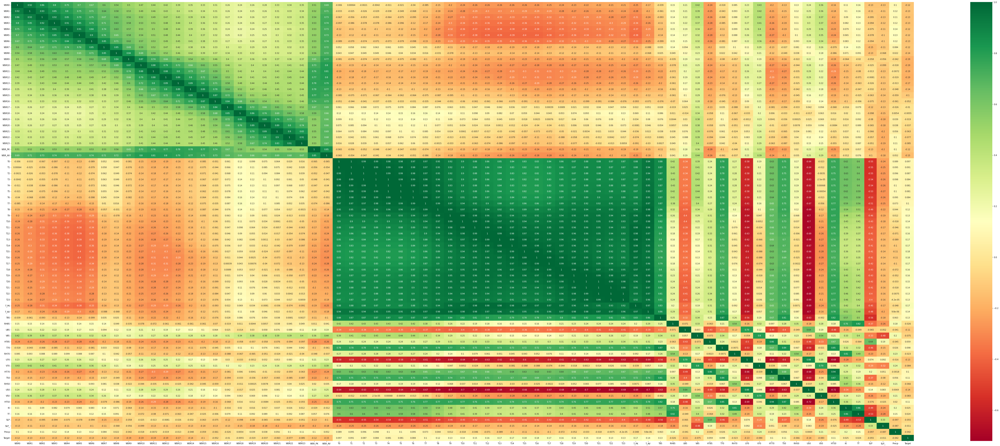

In [40]:
plt.figure(figsize=(100,40))
sns.heatmap(df.corr(), annot=True, cmap='RdYlGn')

We already have 73 attributes out of which 48 attributes are just the hourly readings of certain attributes and we can ignore them as they have high correlation with some other attributes, just so that later on they dont produce errors or irregularity in predictions.

* WSR_0 to WSR_23 is the wind speed from 0 to 24 hours and certainly can be replaced by WSR_AV and WSR_PK which is average and peek of the same.
* T_0 to T_23 is the temperature from 0 to 24 hours and certainly can be replaced by T_AV and T_PK which is average and peek of the same.

# Which independent variables have missing data? How much?

Dropping those which are not necessary and calculating the missing data.

In [41]:
#Dropping the columns which are not necessary and might cause problems later 

df.drop(['WSR0','WSR1','WSR2', 'WSR3','WSR4', 'WSR5','WSR6', 'WSR7','WSR8', 'WSR9','WSR10', 'WSR11','WSR12', 'WSR13',
         'WSR14', 'WSR15','WSR16', 'WSR17','WSR18', 'WSR19','WSR20', 'WSR21','WSR22', 'WSR23',
         'T0','T1','T2', 'T3','T4', 'T5','T6', 'T7','T8', 'T9','T10', 'T11','T12', 'T13',
         'T14', 'T15','T16', 'T17','T18', 'T19','T20', 'T21','T22', 'T23'], axis = 1, inplace=True)
df.iloc[0:,0:].isnull().sum()

WSR_PK    273
WSR_AV    273
T_PK      175
T_AV      175
T85        99
RH85      105
U85       180
V85       180
HT85       95
T70       107
RH70      115
U70       157
V70       157
HT70      100
T50       115
RH50      125
U50       210
V50       210
HT50      112
KI        136
TT        125
SLP        95
SLP_      159
Precp       2
Target      0
dtype: int64

In [43]:
#Checking the percentage of the missing values

missing_list = df.columns[df.isna().any()].tolist() 
missing_count = []      
for i in missing_list:
  missing_count.append(sum(pd.isnull(df[str(i)])))

d = {'Missing_Column':missing_list,'Missing_Values':missing_count}
Missing_DF = pd.DataFrame(d)
Missing_DF["%_Missing"] = (Missing_DF['Missing_Values']/df.shape[0])*100
Missing_DF

,Missing_Column,Missing_Values,%_Missing
0,WSR_PK,273,10.764984
1,WSR_AV,273,10.764984
2,T_PK,175,6.900631
3,T_AV,175,6.900631
4,T85,99,3.903785
5,RH85,105,4.140379
6,U85,180,7.097792
7,V85,180,7.097792
8,HT85,95,3.746057
9,T70,107,4.219243


We can see that all the independant variables have some missing data and the max percentage is 10% so we can drop the rows having such NaN values for now.

In [44]:
#Copying all the data into another so that we can use the dataframe with NaN values later on
df_nan = df.copy(deep=True)
df_nan

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
Date,,,,,,,,,,,,,,,,,,,,,
1/1/1998,5.5,3.1,19.1,12.5,6.7,0.11,3.83,0.14,1612.0,-2.3,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1/2/1998,5.5,3.4,22.4,17.8,9.0,0.25,-0.41,9.53,1594.5,-2.2,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
1/3/1998,5.6,3.5,22.2,18.7,9.0,0.56,0.89,10.17,1568.5,0.9,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
1/4/1998,4.7,3.2,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3.0,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
1/5/1998,3.7,2.3,26.0,21.1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2004,3.9,1.6,14.8,7.7,5.5,0.33,-2.25,-1.92,1576.0,3.2,...,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00,0
12/28/2004,5.0,2.6,18.4,12.9,5.8,0.27,-2.45,4.71,1600.5,3.4,...,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00,0
12/29/2004,3.9,1.9,20.6,17.7,7.5,0.79,7.57,3.13,1591.0,4.6,...,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00,0


In [45]:
df_nan

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
Date,,,,,,,,,,,,,,,,,,,,,
1/1/1998,5.5,3.1,19.1,12.5,6.7,0.11,3.83,0.14,1612.0,-2.3,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1/2/1998,5.5,3.4,22.4,17.8,9.0,0.25,-0.41,9.53,1594.5,-2.2,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
1/3/1998,5.6,3.5,22.2,18.7,9.0,0.56,0.89,10.17,1568.5,0.9,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
1/4/1998,4.7,3.2,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3.0,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
1/5/1998,3.7,2.3,26.0,21.1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2004,3.9,1.6,14.8,7.7,5.5,0.33,-2.25,-1.92,1576.0,3.2,...,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00,0
12/28/2004,5.0,2.6,18.4,12.9,5.8,0.27,-2.45,4.71,1600.5,3.4,...,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00,0
12/29/2004,3.9,1.9,20.6,17.7,7.5,0.79,7.57,3.13,1591.0,4.6,...,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00,0


In [46]:
#Dropping all the NaN rows
df_nan=df_nan.dropna()
df_nan

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
Date,,,,,,,,,,,,,,,,,,,,,
1/1/1998,5.5,3.1,19.1,12.5,6.7,0.11,3.83,0.14,1612.0,-2.3,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1/2/1998,5.5,3.4,22.4,17.8,9.0,0.25,-0.41,9.53,1594.5,-2.2,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
1/3/1998,5.6,3.5,22.2,18.7,9.0,0.56,0.89,10.17,1568.5,0.9,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
1/4/1998,4.7,3.2,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3.0,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
1/7/1998,7.0,5.2,15.8,9.7,12.6,0.98,0.48,7.46,1413.0,4.6,...,0.84,6.86,25.60,5695.0,26.75,48.45,10040.0,-80.0,0.18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2004,3.9,1.6,14.8,7.7,5.5,0.33,-2.25,-1.92,1576.0,3.2,...,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00,0
12/28/2004,5.0,2.6,18.4,12.9,5.8,0.27,-2.45,4.71,1600.5,3.4,...,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00,0
12/29/2004,3.9,1.9,20.6,17.7,7.5,0.79,7.57,3.13,1591.0,4.6,...,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00,0


In [48]:
df_nan.shape

(1922, 25)

In [47]:
#Checking if we lost any significant amount of Target variables
ozone = (df_nan['Target'] == 1)
df_nan[ozone]

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
Date,,,,,,,,,,,,,,,,,,,,,
4/30/1998,3.3,1.6,28.9,20.3,12.4,0.49,4.65,-2.21,1507.0,3.10,...,0.22,17.14,5.87,5745.0,16.40,43.50,10145.0,-10.0,0.00,1
5/7/1998,3.2,2.0,35.5,27.5,23.4,0.28,7.63,3.70,1478.5,11.00,...,0.18,21.59,-6.76,5840.0,0.90,37.50,10065.0,-20.0,0.00,1
5/11/1998,4.3,2.3,30.7,24.6,15.9,0.45,2.82,-7.75,1499.0,8.50,...,0.14,24.08,-6.15,5835.0,3.60,36.40,10110.0,45.0,0.00,1
5/18/1998,3.3,1.5,34.4,26.2,19.0,0.20,2.14,-1.80,1583.0,12.10,...,0.59,5.38,-2.80,5935.0,5.70,36.40,10190.0,-10.0,0.00,1
5/29/1998,3.1,1.5,35.9,29.1,18.7,0.74,-1.12,1.37,1549.5,9.90,...,0.19,3.57,-2.00,5890.0,22.95,49.35,10140.0,5.0,0.00,1
8/1/1998,3.1,1.7,39.1,31.2,22.5,0.41,-4.75,-0.87,1599.0,9.70,...,0.19,-4.96,-1.06,5965.0,23.20,42.40,10180.0,5.0,0.00,1
8/2/1998,3.5,1.8,39.5,32.1,21.5,0.64,-3.29,-4.47,1591.0,9.40,...,0.17,-4.33,-2.78,5955.0,35.65,46.40,10165.0,-15.0,0.00,1
8/15/1998,3.0,1.4,34.9,28.7,18.6,0.69,7.31,1.38,1517.0,9.00,...,0.84,6.61,2.14,5860.0,33.05,44.70,10110.0,-40.0,0.00,1
8/30/1998,2.9,1.7,33.9,28.5,20.9,0.64,-4.13,-2.18,1555.5,9.70,...,0.37,0.47,2.64,5910.0,24.90,48.00,10130.0,-5.0,0.51,1


We can see that we almost dropped 500 rows and yet only lost about 13 rows which had our Target variable as ozone day. This means that we havent lost any significant data and can maybe process the data without dropping NaN values, filling them with other methods and predicting the variable.

# What are the distributions of the predictor variables ?

First we perform Q-Q plot to check the distribution as professor taught and later we use histogram type for learning some other methods.

<Figure size 360x216 with 0 Axes>

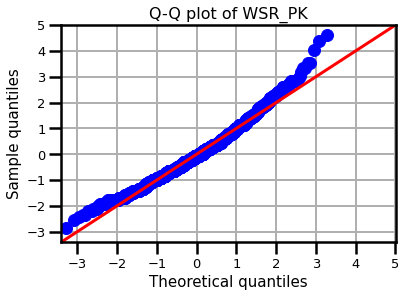

<Figure size 360x216 with 0 Axes>

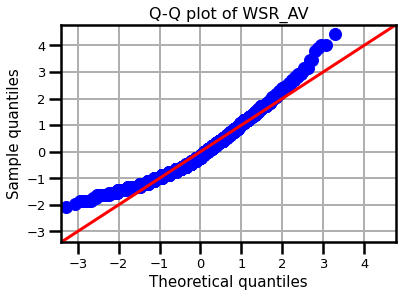

<Figure size 360x216 with 0 Axes>

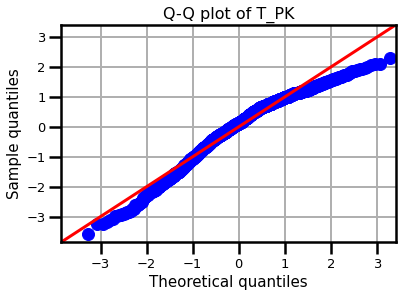

<Figure size 360x216 with 0 Axes>

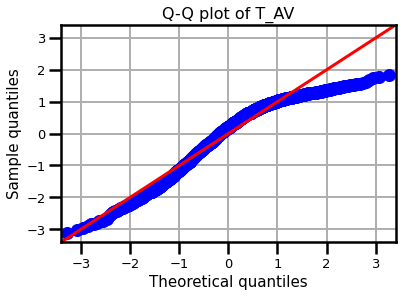

<Figure size 360x216 with 0 Axes>

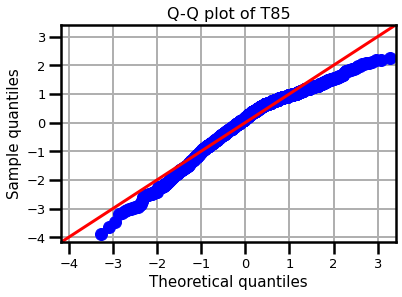

<Figure size 360x216 with 0 Axes>

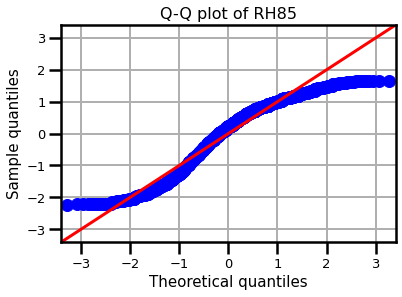

<Figure size 360x216 with 0 Axes>

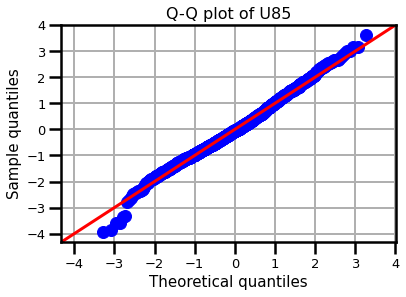

<Figure size 360x216 with 0 Axes>

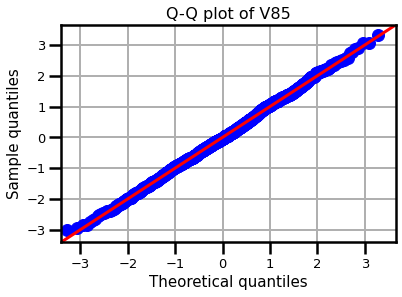

<Figure size 360x216 with 0 Axes>

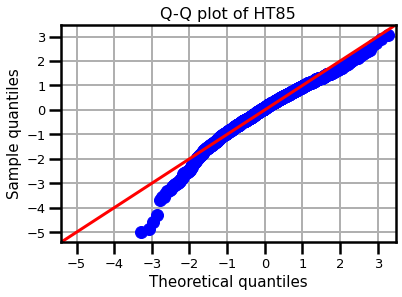

<Figure size 360x216 with 0 Axes>

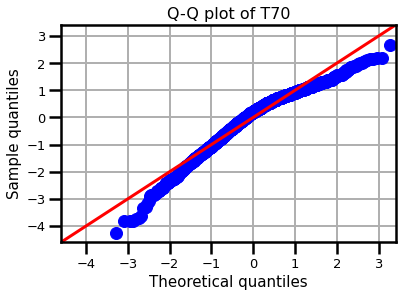

<Figure size 360x216 with 0 Axes>

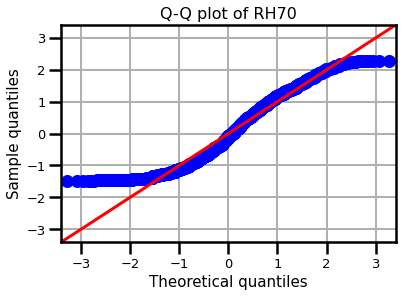

<Figure size 360x216 with 0 Axes>

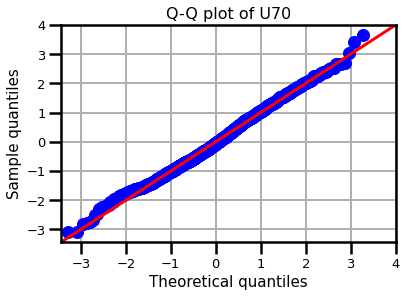

<Figure size 360x216 with 0 Axes>

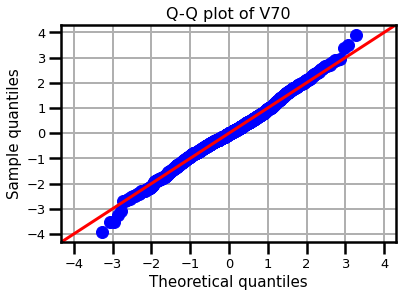

<Figure size 360x216 with 0 Axes>

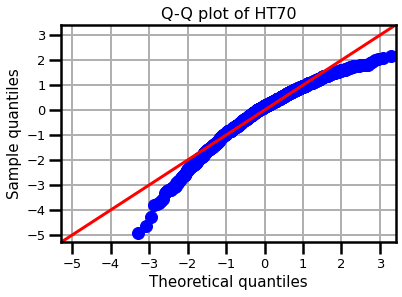

<Figure size 360x216 with 0 Axes>

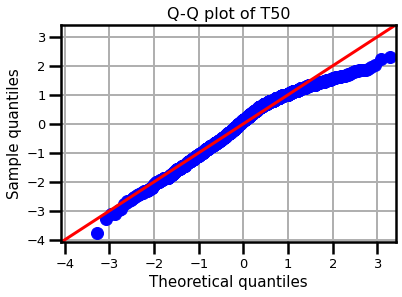

<Figure size 360x216 with 0 Axes>

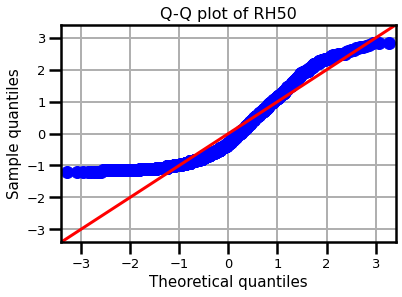

<Figure size 360x216 with 0 Axes>

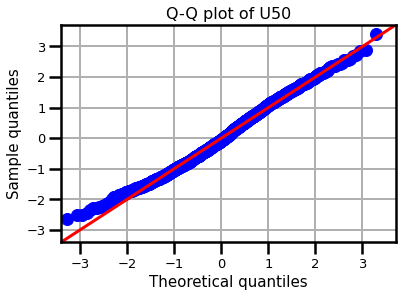

<Figure size 360x216 with 0 Axes>

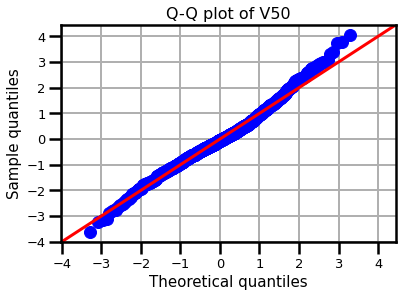

<Figure size 360x216 with 0 Axes>

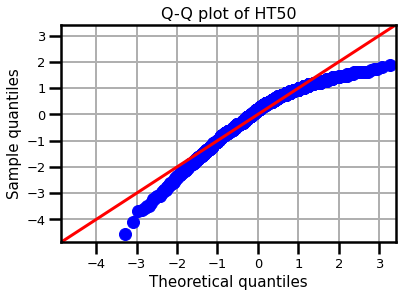

<Figure size 360x216 with 0 Axes>

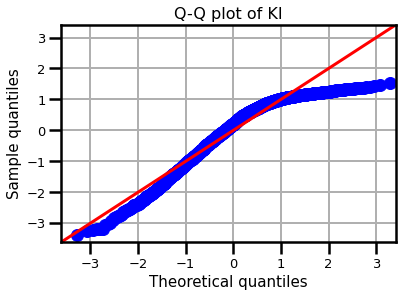

<Figure size 360x216 with 0 Axes>

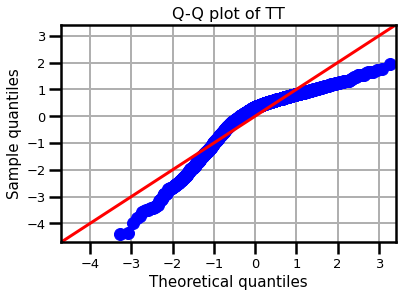

<Figure size 360x216 with 0 Axes>

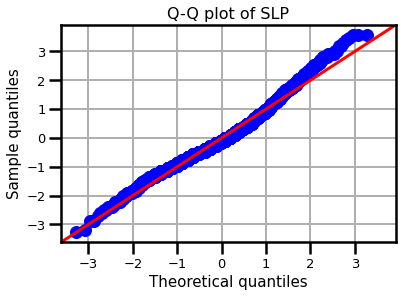

<Figure size 360x216 with 0 Axes>

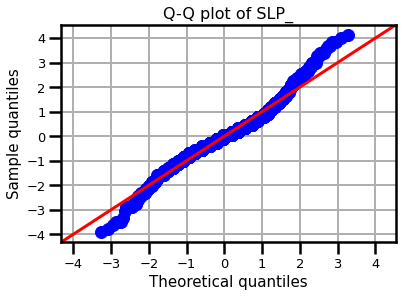

<Figure size 360x216 with 0 Axes>

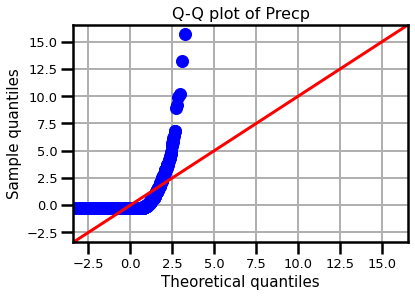

<Figure size 360x216 with 0 Axes>

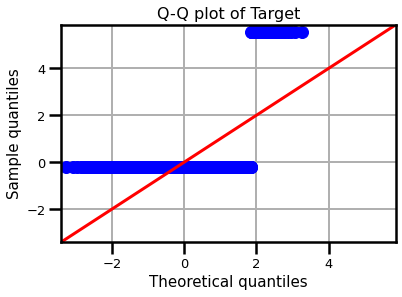

In [54]:
#Q-Q Plot for the dataframe

from statsmodels.graphics.gofplots import qqplot
data_norm=df_nan[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70',
                  'V70','HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]
for c in df_nan.columns[:24]:
  plt.figure(figsize=(5,3))
  fig=qqplot(df_nan[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

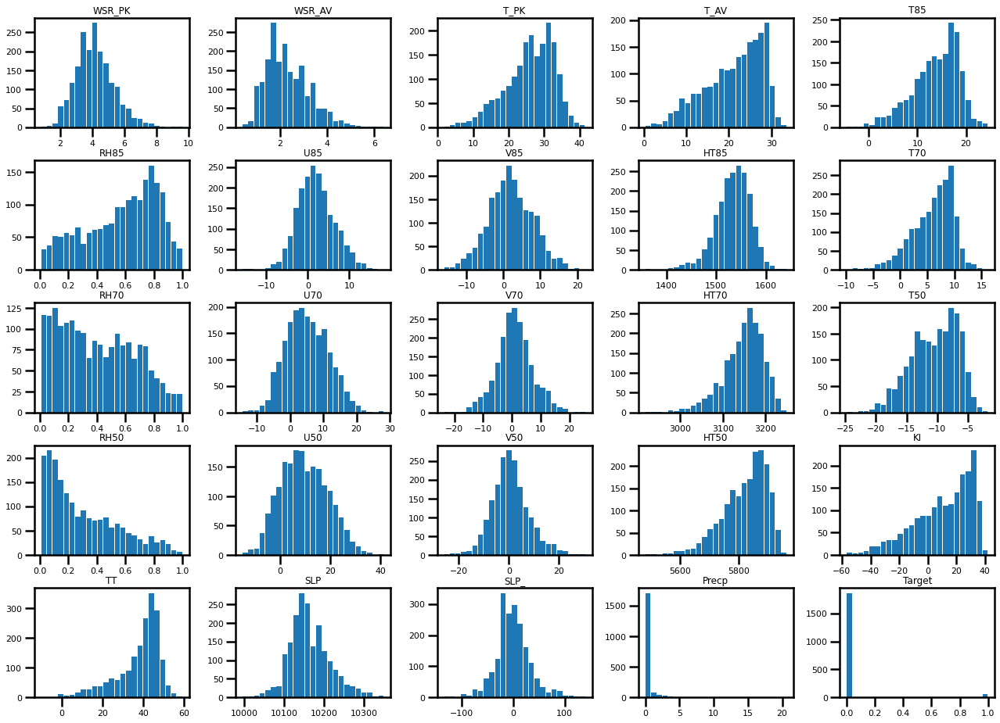

In [55]:
#Plotting the histogram for each column to check the distributions of all the variables
sns.set_context('poster', font_scale=0.5)
df_nan.hist(bins=25, grid=False, figsize=(22,16), zorder=2, rwidth=0.9)
plt.show()


## We can see that each attribute has a different kind of distribution as follows
1. Normal Distribution - U85, V85, U70, V70, U50, V50, SLP, SLP_
2. Left Skewed Distribution - WSR_PK, WSR_AV, RH50
3. Rigth Skewed Distribution - T_PK, T_AV, T85, HT85, T70, HT70, HT50, KI,TT
4. Bimodal Distribution - RH85, RH70, T50
5. None - Precp


# Data Normalization
Also checking the ranges of all the variables.

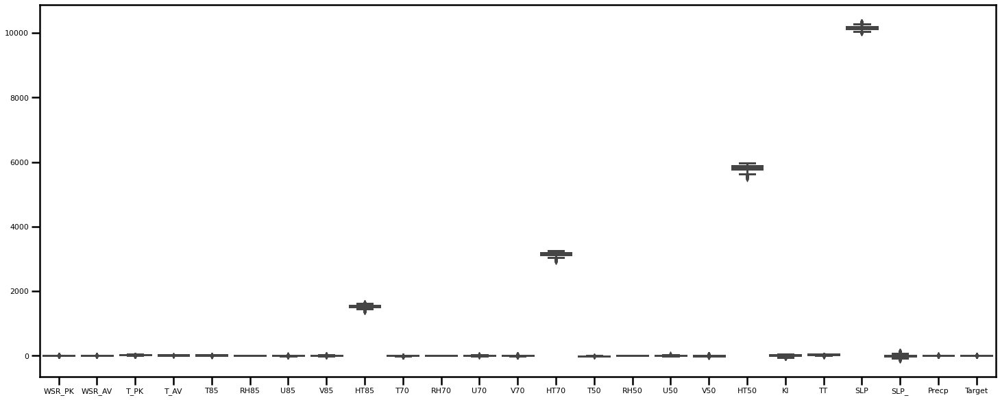

In [58]:
#Plotting boxplot
plt.figure(figsize=(25,10))
sns.boxplot(data=df_nan)

In [59]:
#Normalizing values for the attributes HT85, HT70, HT50, SLP as they have really furthered values from others

from sklearn import preprocessing
data = df_nan.copy(deep=True)

# Create x to store scaled values as floats
x = data[['HT85','HT70','HT50','SLP']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
data[['HT85','HT70','HT50','SLP']] = pd.DataFrame(x_scaled)

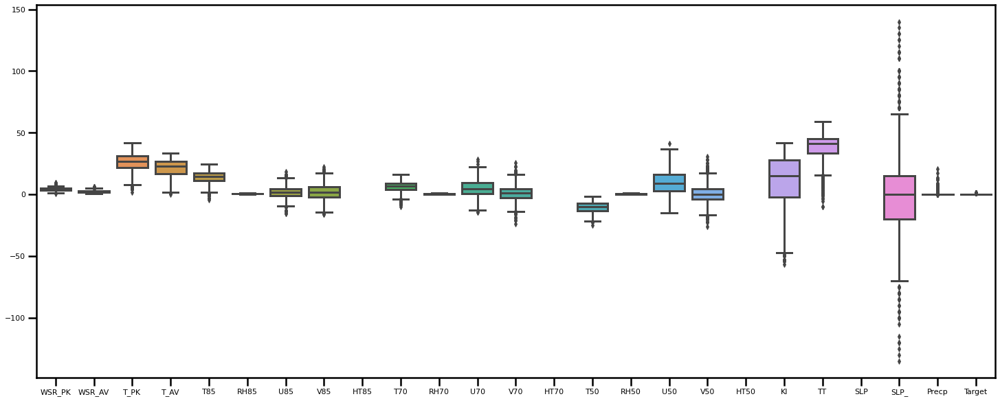

In [60]:
#Plotting the boxplot

plt.figure(figsize=(25,10))
sns.boxplot(data=data)

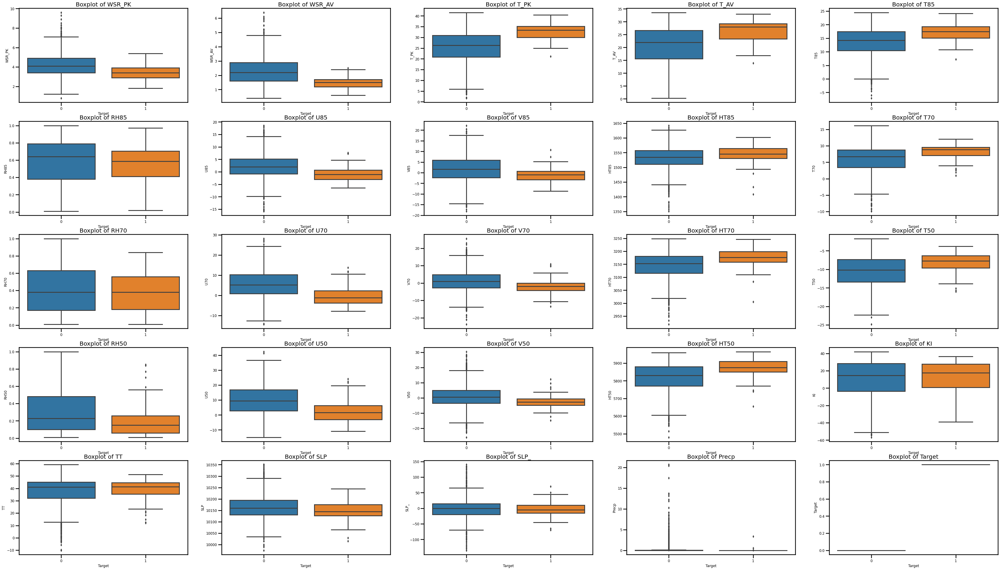

In [62]:
# Plotting one to one boxplots to check the ranges of the variables
i=1
plt.figure(figsize=(60,70))
for c in df_nan.columns[:]:
    plt.subplot(10,5,i)
    plt.title(f"Boxplot of {c}",fontsize=20)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    sns.boxplot(y=df[c],x=df['Target'])
    i+=1
plt.show()

Looking at both of these we can see that there are multiple variables which have a lot of outliers and hence we needed to check each of it directly comparing it to target as the second figure.

In [63]:
#Checking the correlation of all the variables.

df_cor = df_nan.corr()
df_cor

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
WSR_PK,1.000000,0.849976,-0.174094,-0.133985,-0.101861,0.014610,0.177049,0.394836,-0.264715,-0.094785,...,0.027336,0.214340,0.262708,-0.237677,-0.021687,0.064178,-0.124735,-0.233268,0.114039,-0.122401
WSR_AV,0.849976,1.000000,-0.240430,-0.157648,-0.090786,0.045926,0.185820,0.473328,-0.251258,-0.048913,...,0.044621,0.242407,0.291857,-0.205151,-0.004725,0.080493,-0.098099,-0.208022,0.064873,-0.153463
T_PK,-0.174094,-0.240430,1.000000,0.970108,0.828568,0.180743,-0.331464,0.145140,0.269090,0.745268,...,0.001082,-0.674665,-0.237401,0.748660,0.409703,0.388773,-0.467443,-0.138329,-0.060212,0.173154
T_AV,-0.133985,-0.157648,0.970108,1.000000,0.861964,0.280881,-0.348174,0.251086,0.264749,0.780421,...,0.084018,-0.683767,-0.157051,0.777333,0.500756,0.473248,-0.501115,-0.165176,-0.012507,0.140541
T85,-0.101861,-0.090786,0.828568,0.861964,1.000000,0.209672,-0.270339,0.311225,0.187565,0.867002,...,0.140373,-0.614362,0.002500,0.810563,0.541714,0.472501,-0.573350,-0.127742,0.047559,0.126774
RH85,0.014610,0.045926,0.180743,0.280881,0.209672,1.000000,-0.034227,0.307130,-0.075327,0.164427,...,0.325302,-0.166884,0.276738,0.151421,0.751700,0.815577,-0.356464,-0.219727,0.175731,-0.025722
U85,0.177049,0.185820,-0.331464,-0.348174,-0.270339,-0.034227,1.000000,0.104146,-0.420334,-0.267267,...,-0.020049,0.635909,0.186471,-0.446672,-0.111521,0.001526,-0.096887,-0.093406,-0.042817,-0.106050
V85,0.394836,0.473328,0.145140,0.251086,0.311225,0.307130,0.104146,1.000000,-0.123209,0.317442,...,0.221451,-0.034234,0.538442,0.167257,0.306162,0.375396,-0.332221,-0.446603,0.194977,-0.089866
HT85,-0.264715,-0.251258,0.269090,0.264749,0.187565,-0.075327,-0.420334,-0.123209,1.000000,0.190646,...,-0.033028,-0.462838,-0.314806,0.645472,-0.002620,-0.095790,0.654858,0.225282,-0.049654,0.057722
T70,-0.094785,-0.048913,0.745268,0.780421,0.867002,0.164427,-0.267267,0.317442,0.190646,1.000000,...,0.040149,-0.555812,-0.009024,0.839764,0.280380,0.292056,-0.471902,-0.100708,-0.001473,0.094089


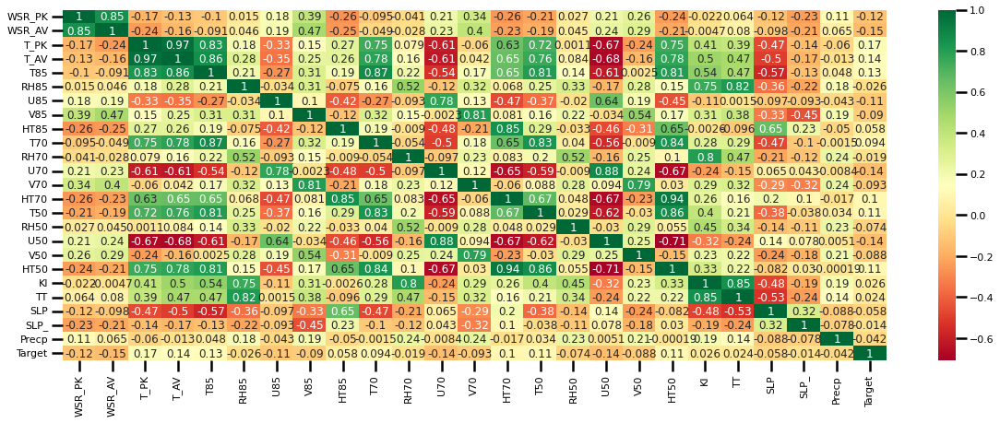

In [64]:
#Heatmap for the correlation of the attributes

plt.figure(figsize=(20,7))
sns.heatmap(df_nan.corr(), annot=True, cmap='RdYlGn')

We have alot of variables which have high correlation such as T_PK with T_AV and T85, HT50 with HT70, T70 and T50 which may say that all these are predicting the same things.

In [65]:
#Correlation with output variable
cor_target = abs(df_cor['T_PK'])
#Selecting highle correlated features
rel_features = cor_target
rel_features

WSR_PK    0.174094
WSR_AV    0.240430
T_PK      1.000000
T_AV      0.970108
T85       0.828568
RH85      0.180743
U85       0.331464
V85       0.145140
HT85      0.269090
T70       0.745268
RH70      0.079170
U70       0.607425
V70       0.059982
HT70      0.634257
T50       0.724175
RH50      0.001082
U50       0.674665
V50       0.237401
HT50      0.748660
KI        0.409703
TT        0.388773
SLP       0.467443
SLP_      0.138329
Precp     0.060212
Target    0.173154
Name: T_PK, dtype: float64

In [66]:
rel_features = cor_target[cor_target>0.8]
rel_features

T_PK    1.000000
T_AV    0.970108
T85     0.828568
Name: T_PK, dtype: float64

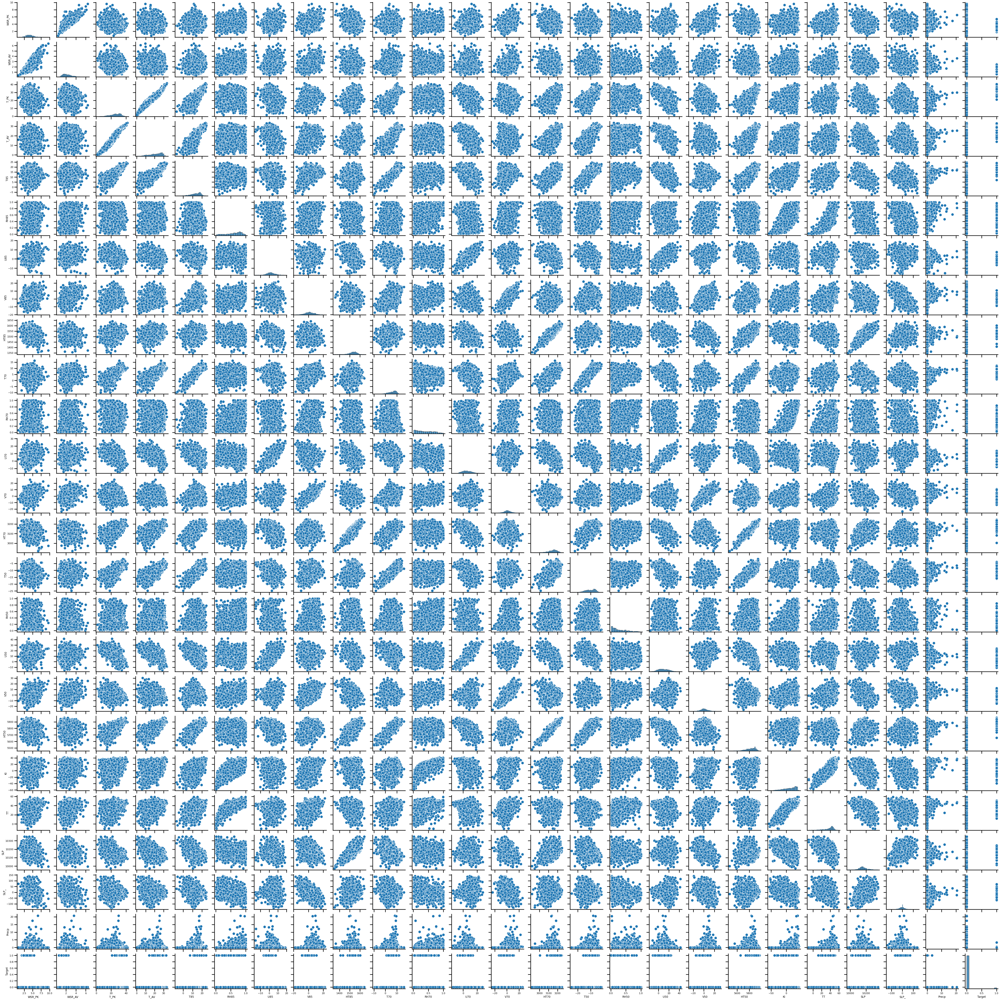

In [67]:
sns.pairplot(df)

# In the predictor variables independent of all the other predictor variables?
There is some correlation between independent variables which might say that they are dependent on each other.
* HT85, HT70, HT50 - Geopotential heights at different altitudes
* T85, T70, T50 - Temperatures at different hpa levels
* KI, TT - K-Index, Total-Totals Index. These are the storm potential and stability index.

#Auto-correlation Function

In [68]:
#Distributed autocorrelation between predictor and dependent variable
columns = df_nan[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70',
                'U70','V70','HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]
target = df_nan[['Target']]

<Figure size 360x216 with 0 Axes>

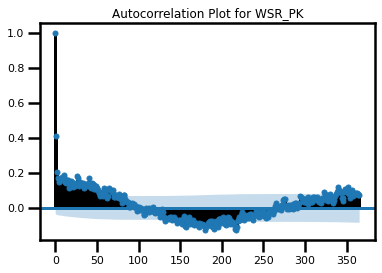

<Figure size 360x216 with 0 Axes>

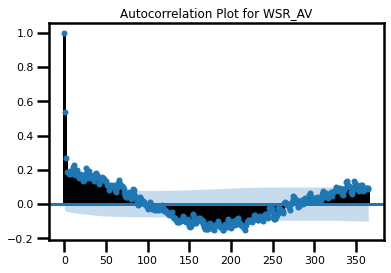

<Figure size 360x216 with 0 Axes>

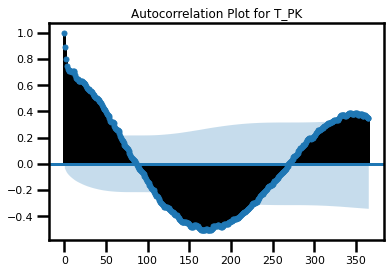

<Figure size 360x216 with 0 Axes>

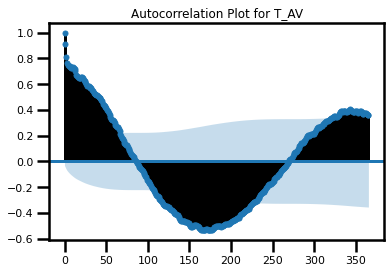

<Figure size 360x216 with 0 Axes>

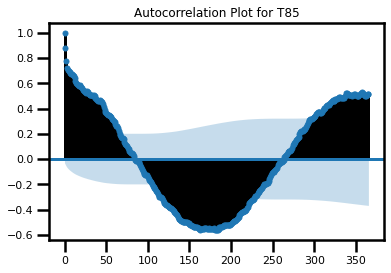

<Figure size 360x216 with 0 Axes>

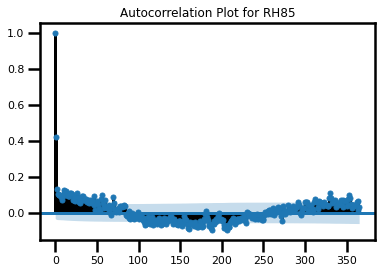

<Figure size 360x216 with 0 Axes>

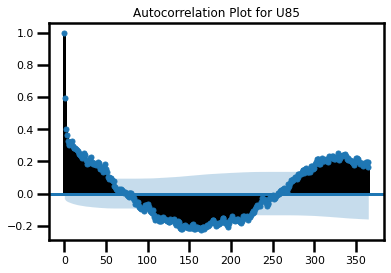

<Figure size 360x216 with 0 Axes>

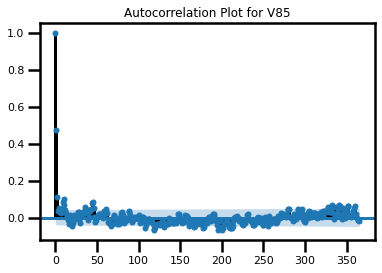

<Figure size 360x216 with 0 Axes>

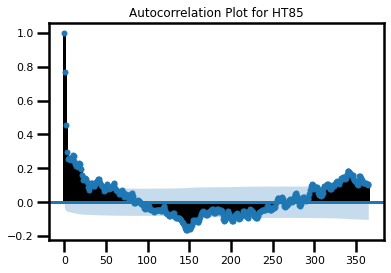

<Figure size 360x216 with 0 Axes>

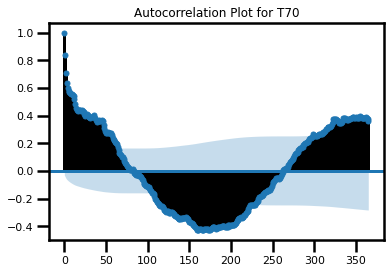

<Figure size 360x216 with 0 Axes>

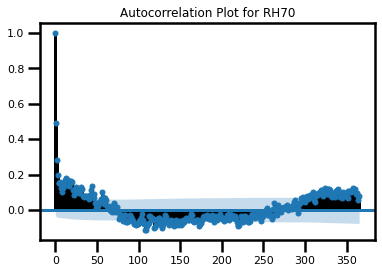

<Figure size 360x216 with 0 Axes>

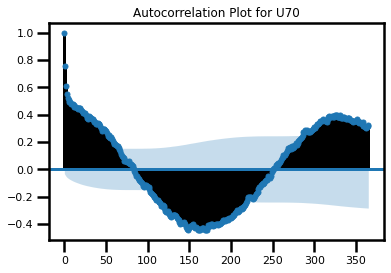

<Figure size 360x216 with 0 Axes>

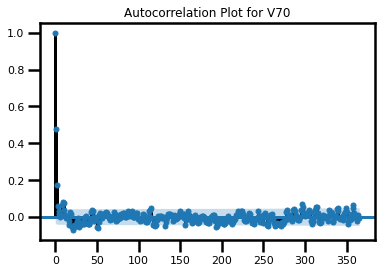

<Figure size 360x216 with 0 Axes>

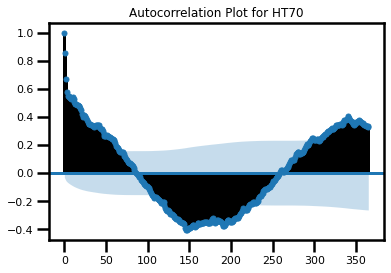

<Figure size 360x216 with 0 Axes>

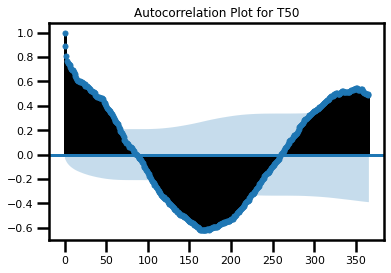

<Figure size 360x216 with 0 Axes>

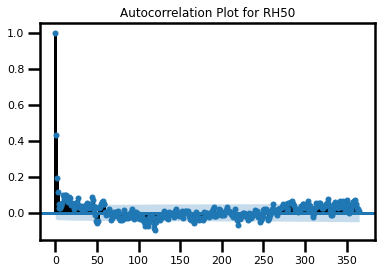

<Figure size 360x216 with 0 Axes>

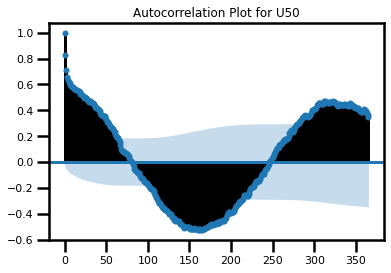

<Figure size 360x216 with 0 Axes>

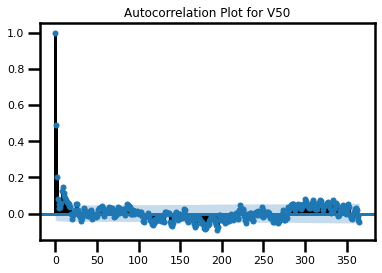

<Figure size 360x216 with 0 Axes>

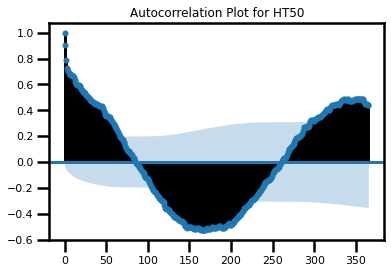

<Figure size 360x216 with 0 Axes>

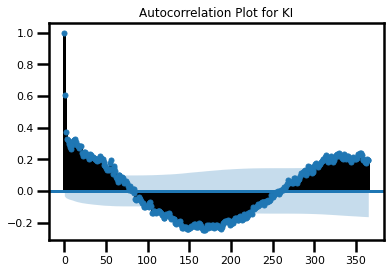

<Figure size 360x216 with 0 Axes>

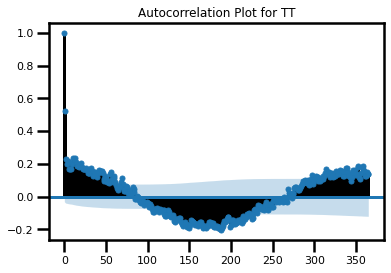

<Figure size 360x216 with 0 Axes>

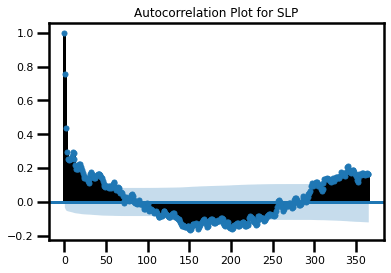

<Figure size 360x216 with 0 Axes>

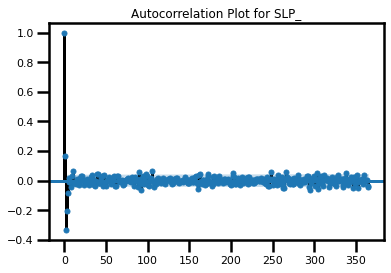

<Figure size 360x216 with 0 Axes>

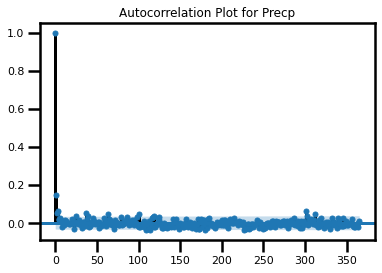

In [69]:
#Auto-Correlation function
from statsmodels.graphics.tsaplots import plot_acf

for column in columns:
    plt.figure(figsize=(5,3))
    plot_acf(df[column].dropna(), lags=365, alpha=0.1)
    plt.title(f'Autocorrelation Plot for {column}')
    plt.show()

We used plot_acf(), which is AutoCorrelation Function which is usually used in Time Series Data to find out the correlation between the current and lagged version of the data.
In the graph above, the plots/spikes are above the shaded region (confidence level=95%) which mean that it has a significantly positive autocorrelation and hence are important features.

#Building Models

## Identifying predictor significance

In [70]:
import statsmodels.api as sm

model = sm.OLS(df_nan['Target'], df_nan[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']])
result = model.fit()
# Print out the statistics
print(result.summary())

                                 OLS Regression Results                                
Dep. Variable:                 Target   R-squared (uncentered):                   0.092
Model:                            OLS   Adj. R-squared (uncentered):              0.081
Method:                 Least Squares   F-statistic:                              8.040
Date:                Sun, 05 Feb 2023   Prob (F-statistic):                    8.76e-27
Time:                        01:00:25   Log-Likelihood:                          697.42
No. Observations:                1922   AIC:                                     -1347.
Df Residuals:                    1898   BIC:                                     -1213.
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

P-value says that the significant variables are V85, T_PK, T_AV and SLP_ according to the OLS model.

#Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)
The three methods I have used are Heatmap, AutoCorrelation and OLS model to find out the significant variables to predict the target.
All of the variables which were found out to be significant are mentioned after every method.

In [71]:
from sklearn.model_selection import  train_test_split

X = df_nan[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]

y = df_nan['Target']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

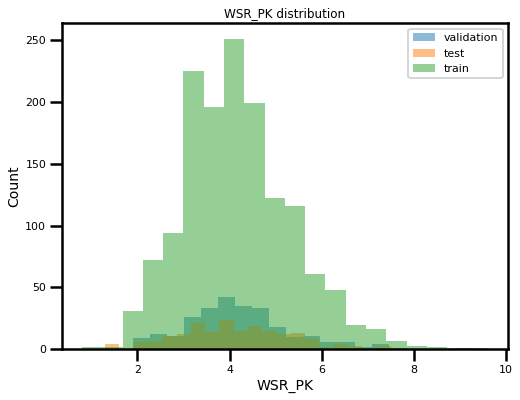

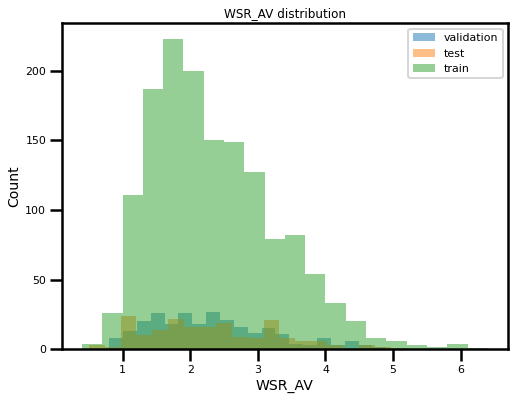

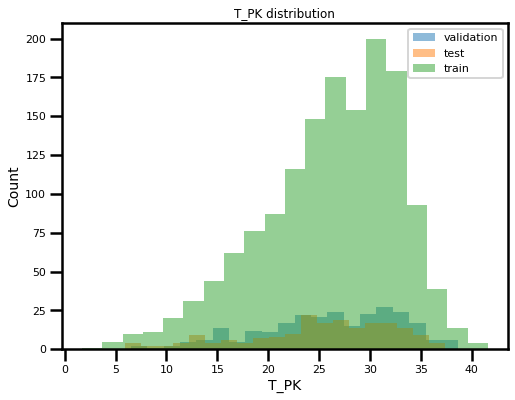

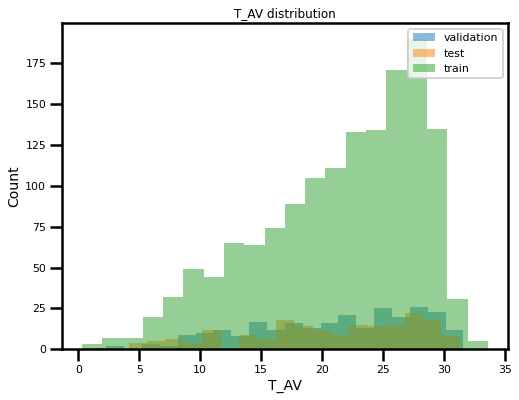

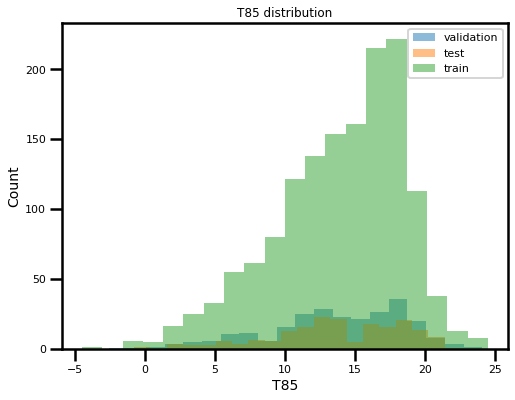

...

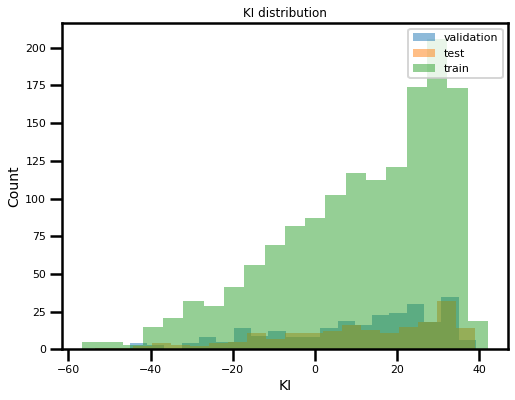

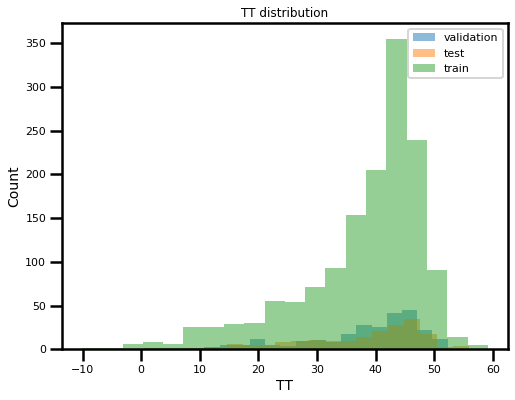

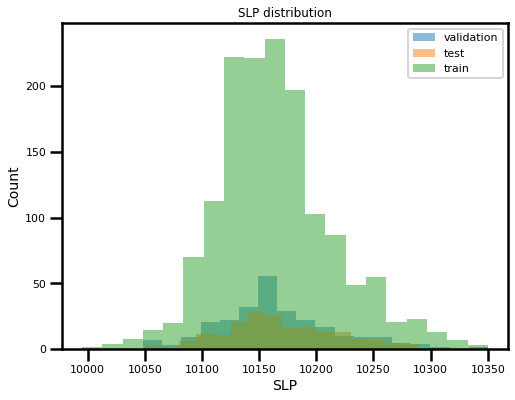

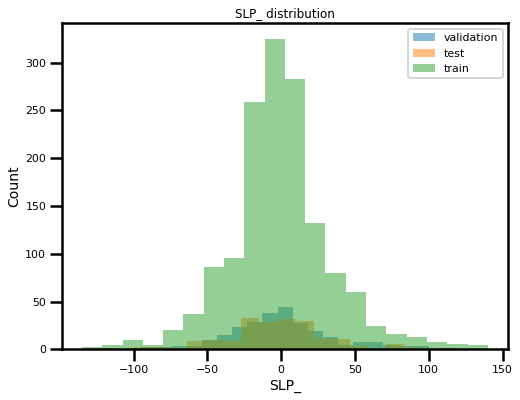

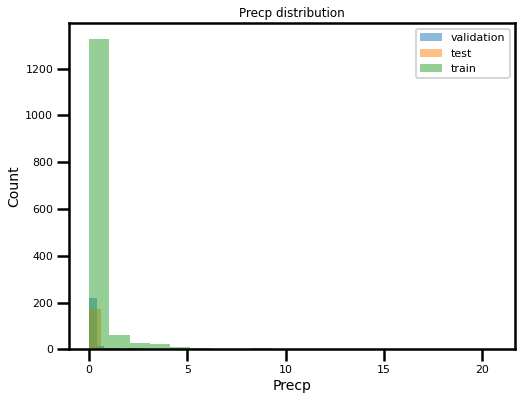

In [72]:
#Plotting the data distributions acording to test, validation and train data.

X_test_plot = X_test[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]

X_val_plot = X_val[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]

X_train_plot = X_train[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

We can see the data we are using ton train our model is equally distributed from the dataframe yet some of the extremities arent covered.

#Do the training and test sets have the same data?
Ans- No, the training and test data sets are typically different. The training data set is used to train the model, while the test data set is used to evaluate the performance of the trained model. The test data set is typically a smaller and independent set of data, that is not used during the training process, and is used to give an unbiased estimate of the model's performance on unseen data.

#Making Predictions

##Linear Regression

In [73]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [74]:
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

LinearRegression()

In [75]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_train, y_pred))
r2 = r2_score(y_train,y_pred)
print('R^2 score on tarining set =',r2)

Mean squared error: 0.03
Coefficient of determination: 0.06
R^2 score on tarining set = 0.060502557150205694


In [76]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.02
Coefficient of determination: 0.05
R^2 score on test set = 0.04673638119186263


In [77]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_val, y_pred))
r2_val = r2_score(y_val,y_pred)
print('R^2 score on validation set =',r2_val)

Mean squared error: 0.03
Coefficient of determination: 0.07
R^2 score on validation set = 0.06951553743266992


##Decision Tree

In [80]:
#Decision Tree
#First with the outliers
dfw_outliers = df_nan.copy(deep=True)
dfw_outliers

,WSR_PK,WSR_AV,T_PK,T_AV,T85,RH85,U85,V85,HT85,T70,...,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp,Target
Date,,,,,,,,,,,,,,,,,,,,,
1/1/1998,5.5,3.1,19.1,12.5,6.7,0.11,3.83,0.14,1612.0,-2.3,...,0.15,10.67,-1.56,5795.0,-12.10,17.90,10330.0,-55.0,0.00,0
1/2/1998,5.5,3.4,22.4,17.8,9.0,0.25,-0.41,9.53,1594.5,-2.2,...,0.48,8.39,3.84,5805.0,14.05,29.00,10275.0,-55.0,0.00,0
1/3/1998,5.6,3.5,22.2,18.7,9.0,0.56,0.89,10.17,1568.5,0.9,...,0.60,6.94,9.80,5790.0,17.90,41.30,10235.0,-40.0,0.00,0
1/4/1998,4.7,3.2,19.6,18.7,9.9,0.89,-0.34,8.58,1546.5,3.0,...,0.49,8.73,10.54,5775.0,31.15,51.70,10195.0,-40.0,2.08,0
1/7/1998,7.0,5.2,15.8,9.7,12.6,0.98,0.48,7.46,1413.0,4.6,...,0.84,6.86,25.60,5695.0,26.75,48.45,10040.0,-80.0,0.18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12/27/2004,3.9,1.6,14.8,7.7,5.5,0.33,-2.25,-1.92,1576.0,3.2,...,0.07,7.93,-4.41,5800.0,-25.60,21.80,10295.0,65.0,0.00,0
12/28/2004,5.0,2.6,18.4,12.9,5.8,0.27,-2.45,4.71,1600.5,3.4,...,0.04,5.95,-1.14,5845.0,-19.40,19.10,10310.0,15.0,0.00,0
12/29/2004,3.9,1.9,20.6,17.7,7.5,0.79,7.57,3.13,1591.0,4.6,...,0.06,7.80,-0.64,5845.0,-9.60,35.20,10275.0,-35.0,0.00,0


In [81]:
#Checking the accuracy using decision tree with outliers
information = dfw_outliers[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]
research = dfw_outliers[['Target']]

X_train, X_test, Y_train, Y_test = train_test_split(information, research, test_size=0.3, random_state=0)

In [82]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(max_depth=10)
clf.fit(X_train, Y_train)
Y_pred = clf.predict(X_test) 
dec_tree_score = clf.score(X_test, Y_test)
print('Decision Tree ', dec_tree_score)


Decision Tree  0.9358752166377816


In [83]:
dfw_outliers.shape

(1922, 25)

The Accuracy of the Decision Tree model with the outliers is around 92%.

### IQR Percentile method to remove outliers

In [84]:
#Remove outliers using IQR Percentile
dfwo_outliers = df_nan.copy(deep=True)

def outliers(dfwo_outliers, column):
    Q1=dfwo_outliers[column].quantile(0.25)
    Q3=dfwo_outliers[column].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound= Q1 - 1.5*IQR
    upper_bound= Q3 + 1.5*IQR
    
    ls = dfwo_outliers.index[ (dfwo_outliers[column] < lower_bound) | (dfwo_outliers[column] > upper_bound)]
    
    return ls

In [85]:
index_list = []
for column in ['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']:
    index_list.extend(outliers(dfwo_outliers,column))


In [86]:
def remove(dfwo_outliers,ls):
    ls= sorted(set(ls))
    dfwo_outliers=dfwo_outliers.drop(ls)
    return dfwo_outliers

In [87]:
dfwo_outliers = remove(dfwo_outliers, index_list)

In [88]:
dfwo_outliers.shape

(1203, 25)

In [89]:
#Checking the accuracy using decision tree without outliers
information = dfwo_outliers[['WSR_PK','WSR_AV','T_PK','T_AV','T85','RH85','U85','V85','HT85','T70','RH70','U70','V70',
                                 'HT70','T50','RH50','U50','V50','HT50','KI','TT','SLP','SLP_','Precp']]
research = dfwo_outliers[['Target']]

X_train, X_test, Y_train, Y_test = train_test_split(information, research, test_size=0.3, random_state=0)

In [90]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(max_depth=10)
clf.fit(X_train, Y_train)
Y_pred = clf.predict(X_test) 
dec_tree_score = clf.score(X_test, Y_test)
print('Decision Tree ', dec_tree_score)

Decision Tree  0.9113573407202216


The accuracy falls down to around 90% as we remove the outliers.

#Remove outliers and keep outliers (does if have an effect of the final predictive model)?
We can see that the accuracy dropped around 3% after removing the outliers this is not a big value yet we want as accurate model as we can build so it is better to keep the outliers.

#Imputation of 1%, 5% and 10% of the data after removing and checking its residual

In [91]:
#As we found out the most significant predictor is T_PK using slider to check the values with time series.
import plotly.express as px

fig = px.line(df_nan, y='T_PK', title= 'T_PK with slider')

fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector=dict(
        buttons= list([
            dict(count=1,label ='1y',stepmode='backward'),
            dict(count=2,label ='2y',stepmode='backward'),
            dict(count=3,label ='3y',stepmode='backward'),
            dict(step='all')
        ])
    )
)
fig.show()

###Removing data around 1%, 5% and 10%.

In [92]:
#Imputation Process. Remove 1%, 5% and 10% data randomly for column "T_PK"
df_imp1 = df_nan.copy(deep = True)
df_imp5 = df_nan.copy(deep = True)
df_imp10 = df_nan.copy(deep = True)

column_name = "T_PK"

# Calculate the number of rows to remove (1% of the total number of rows)
rows_to_remove_1 = int(df_imp1.shape[0] * 0.01)
rows_to_remove_5 = int(df_imp5.shape[0] * 0.05)
rows_to_remove_10 = int(df_imp10.shape[0] * 0.10)

# Generate a list of random indices to remove
random_indices_1 = np.random.choice(df_imp1.index, rows_to_remove_1, replace=False)
random_indices_5 = np.random.choice(df_imp5.index, rows_to_remove_5, replace=False)
random_indices_10 = np.random.choice(df_imp10.index, rows_to_remove_10, replace=False)


# Remove the data from the target column for the selected indices
df_imp1.loc[random_indices_1, column_name] = np.nan
df_imp5.loc[random_indices_5, column_name] = np.nan
df_imp10.loc[random_indices_10, column_name] = np.nan


In [93]:
#Checking amount of null values
results = [df_imp1['T_PK'].isnull().sum(), 
           df_imp5['T_PK'].isnull().sum(), 
           df_imp10['T_PK'].isnull().sum()]
print(results)

[19, 96, 192]


###Mean Imputation

In [95]:
# 1] Imputing Mean

df_imp_mean_1 = df_imp1.fillna(df_imp1.mean())
df_imp_mean_5 = df_imp5.fillna(df_imp5.mean())
df_imp_mean_10 = df_imp10.fillna(df_imp10.mean())


In [96]:
# Checking the error by calculating the MSE(Mean Squared Error) and RMSE (Root mean squared error)

from sklearn.metrics import mean_squared_error

og_val = df_nan['T_PK'].values

imp_val_1= df_imp_mean_1['T_PK'].values
imp_val_5= df_imp_mean_5['T_PK'].values
imp_val_10= df_imp_mean_10['T_PK'].values

#MSE
mse_1 = mean_squared_error(og_val,imp_val_1)
mse_5 = mean_squared_error(og_val,imp_val_5)
mse_10 = mean_squared_error(og_val,imp_val_10)

#RMSE
rmse_1 = np.sqrt(mse_1)
rmse_5 = np.sqrt(mse_5)
rmse_10 = np.sqrt(mse_10)


print("RMSE for 1% imputation is", rmse_1)
print("RMSE for 5% imputation is", rmse_5)
print("RMSE for 10% imputation is", rmse_10)

RMSE for 1% imputation is 0.8451775402679033
RMSE for 5% imputation is 1.4008094430683098
RMSE for 10% imputation is 2.095558272729132


This is the root mean squared error for the following imputations

###Linear Interpolation imputation

In [ ]:
# 2] Imputing values using Linear Interpolation

df_imp_li_1 = df_imp1.interpolate(method='linear')
df_imp_li_5 = df_imp5.interpolate(method='linear')
df_imp_li_10 = df_imp10.interpolate(method='linear')


In [ ]:
# Checking the error by calculating the MSE(Mean Squared Error) and RMSE (Root mean squared error)

og_val = df_nan['T_PK'].values

imp_val_1= df_imp_li_1['T_PK'].values
imp_val_5= df_imp_li_5['T_PK'].values
imp_val_10= df_imp_li_10['T_PK'].values

#MSE
mse_1 = mean_squared_error(og_val,imp_val_1)
mse_5 = mean_squared_error(og_val,imp_val_5)
mse_10 = mean_squared_error(og_val,imp_val_10)

#RMSE
rmse_1 = np.sqrt(mse_1)
rmse_5 = np.sqrt(mse_5)
rmse_10 = np.sqrt(mse_10)


print("RMSE for 1% imputation is", rmse_1)
print("RMSE for 5% imputation is", rmse_5)
print("RMSE for 10% imputation is", rmse_10)

RMSE for 1% imputation is 0.39748330287774014
RMSE for 5% imputation is 0.4957812832475544
RMSE for 10% imputation is 0.9127541609874015


This is the root mean squared error for this imputation.

###KNN Imputation

In [97]:
# 3] Imputing values using KNNImputer

from sklearn.impute import KNNImputer as knn

imp_1 = df_imp1['T_PK'].values.reshape(-1,1)
imp_5 = df_imp5['T_PK'].values.reshape(-1,1)
imp_10 = df_imp10['T_PK'].values.reshape(-1,1)

# Impute missing values using KNN imputation
imputer = knn(n_neighbors=5)

imp_knn_1 = imputer.fit_transform(imp_1)
imp_knn_5 = imputer.fit_transform(imp_5)
imp_knn_10 = imputer.fit_transform(imp_10)

In [98]:
# Checking the error by calculating the MSE(Mean Squared Error) and RMSE (Root mean squared error)

og_val = df_nan['T_PK'].values

#MSE
mse_1 = mean_squared_error(og_val,imp_knn_1)
mse_5 = mean_squared_error(og_val,imp_knn_5)
mse_10 = mean_squared_error(og_val,imp_knn_10)

#RMSE
rmse_1 = np.sqrt(mse_1)
rmse_5 = np.sqrt(mse_5)
rmse_10 = np.sqrt(mse_10)


print("RMSE for 1% imputation is", rmse_1)
print("RMSE for 5% imputation is", rmse_5)
print("RMSE for 10% imputation is", rmse_10)

RMSE for 1% imputation is 0.8451775402679033
RMSE for 5% imputation is 1.4008094430683098
RMSE for 10% imputation is 2.095558272729132


This is the root mean squared error for this imputation.

#References

https://pandas.pydata.org/

https://matplotlib.org/

https://docs.scipy.org/doc/scipy/tutorial/interpolate.html

https://www.javatpoint.com/rsme-root-mean-square-error-in-python

https://www.analyticsvidhya.com/blog/2021/09/q-q-plot-ensure-your-ml-model-is-based-on-the-right-distributions/

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

https://scikit-learn.org/stable/modules/impute.html

https://plotly.com/python/plotly-express/

https://www.ucd.ie/ecomodel/Resources/QQplots_WebVersion.html#:~:text=Normally%20distributed%20data,-Below%20is%20an&text=The%20normal%20distribution%20is%20symmetric,deviate%20from%20the%20straight%20line).

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynb

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Wine_Quality.ipynb 

MIT License
Copyright (c) 2023 Shubham Milind Idekar

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.